In [1]:
import torch
import torchvision
from tqdm import tqdm
import argparse
import os
import sys
# Try to get torchinfo, install it if it doesn't work

from com.common_packages import check_if_dir_existed
from com.colors import COLOR
import matplotlib.pyplot as plt

#from dataset import get_datasets
#from dataset import get_data_loaders
#from dataset import show_batch_grid
from models import efficientnet
from models import densenet
import config
import time
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = False
from dataset import load_dataset

import dataset
import numpy as np
import utils
print(config.CFG.epochs)
import engine

torch.Size([4, 10]) torch.Size([4, 3, 224, 224])
100


In [2]:
DATA = 'weather_2'
dataset=f'/media/igofed/SSD_2T/DATASETS/{DATA}'
model_name='efficientnet_b0'
train_path = os.path.join(dataset, 'train')
valid_path = os.path.join(dataset, 'valid')
test_path = os.path.join(dataset, 'test')
check_if_dir_existed(train_path)
check_if_dir_existed(valid_path)
check_if_dir_existed(test_path)
device = utils.select_device(gpu=True)


folder 		: /media/igofed/SSD_2T/DATASETS/weather_2/train is available
folder 		: /media/igofed/SSD_2T/DATASETS/weather_2/valid is available
folder 		: /media/igofed/SSD_2T/DATASETS/weather_2/test is available


 [INFO]: Custom Loader for :	 train data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: train Set:	2254
	[INFO]: 705:	Class0 31.3%
	[INFO]: 1549:	Class1 68.7%
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class0 705  Images 
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class1 1549  Images 

[INFO] : Original train Set Size: 	2254
	Num. of batches: 		71
	Num. of total examples: 	2254
 ---------------------------------------
Folder 		: /home/igofed/LiU/AI4Climate_/src/figures is available
/home/igofed/LiU/AI4Climate_/src/figures/Balanced_train_20221205-160326.png
Class names: ['Class0', 'Class1']


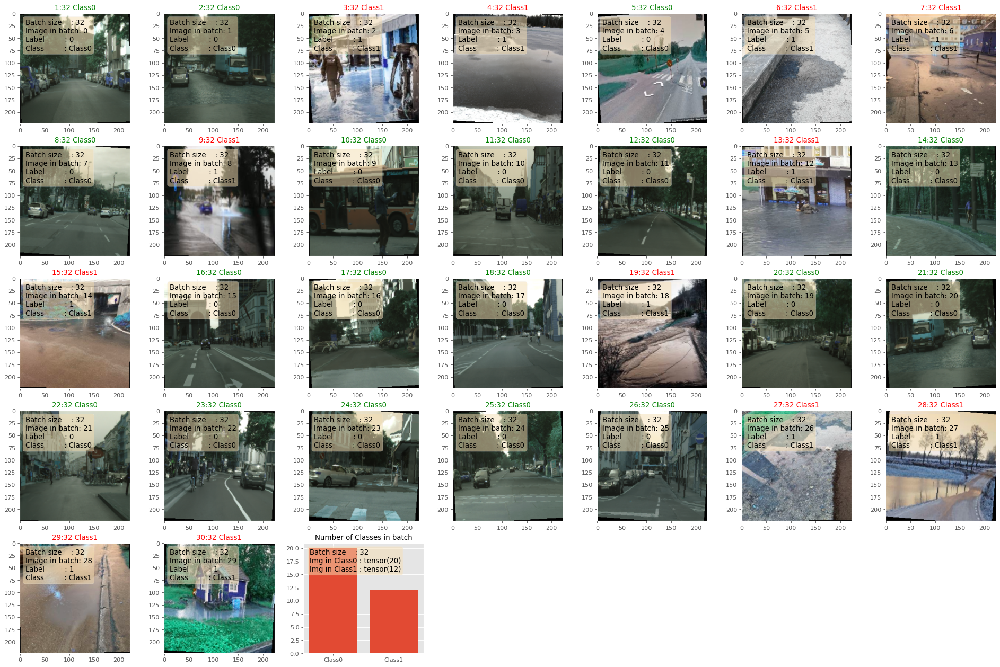

In [3]:
train_set, train_loader = load_dataset(train_path, mode='train', balance_dataset=True)
class_names = train_set.classes
utils.show_batch_grid(train_loader, True, 'train', True)
print(f"Class names: {class_names}")


Create Train and Valid loader

 [INFO]: Custom Loader for :	 valid data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: valid Set:	2254
	[INFO]: 705:	Class0 31.3%
	[INFO]: 1549:	Class1 68.7%
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class0 705  Images 
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class1 1549  Images 

[INFO] : Original valid Set Size: 	2254
	Num. of batches: 		71
	Num. of total examples: 	2254
 ---------------------------------------
Folder 		: /home/igofed/LiU/AI4Climate_/src/figures is available
/home/igofed/LiU/AI4Climate_/src/figures/Balanced_valid_20221205-160402.png


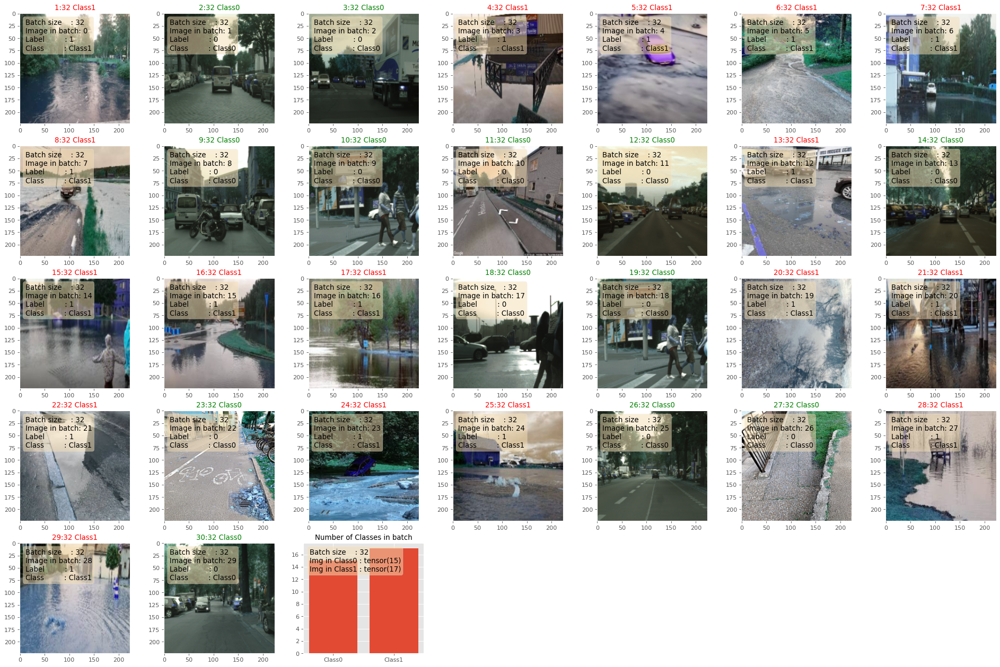

In [4]:
valid_set, valid_loader = load_dataset(train_path, mode='valid', balance_dataset=True)
utils.show_batch_grid(valid_loader, True, 'valid', True)

 [INFO]: Custom Loader for :	 test data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: test Set:	477
	[INFO]: 144:	Class0 30.2%
	[INFO]: 333:	Class1 69.8%
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0 144  Images 
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1 333  Images 

[INFO] : Original test Set Size: 	477
	Num. of batches: 		15
	Num. of total examples: 	477
 ---------------------------------------
Folder 		: /home/igofed/LiU/AI4Climate_/src/figures is available
/home/igofed/LiU/AI4Climate_/src/figures/Balanced_test_20221205-160414.png


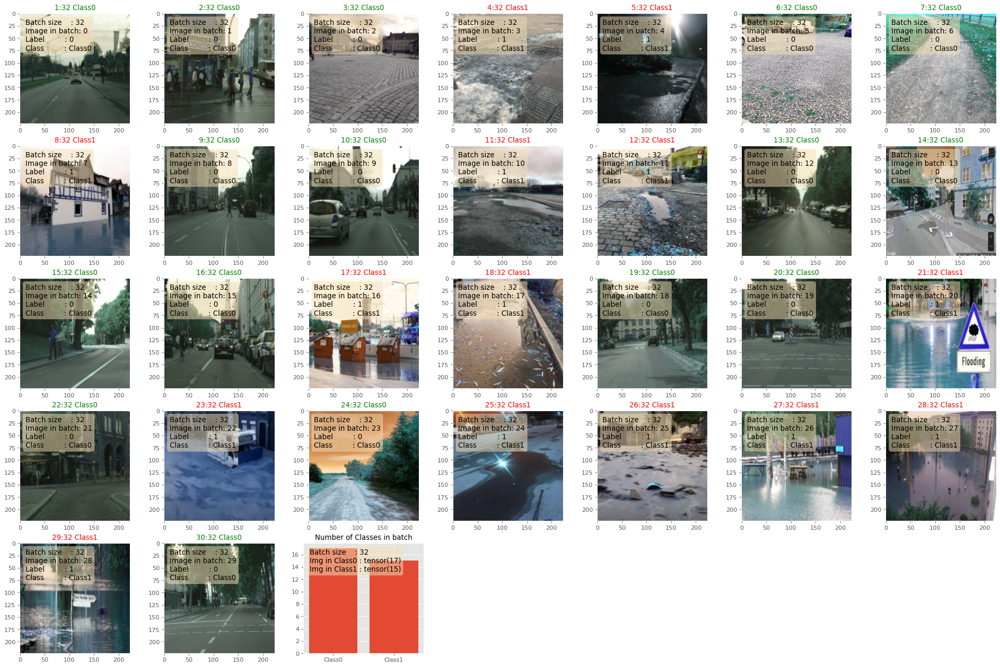

In [5]:
test_set, test_loader = load_dataset(test_path, mode='test', balance_dataset=True)
utils.show_batch_grid(test_loader, True, 'test', True)

In [7]:
model = efficientnet.EfficientNet(
        version="efficientnet_b0",
        num_classes=2,
    ).to(device)
print('Done')

Done


In [8]:
def define_loss() -> torch.nn.CrossEntropyLoss:
    criterion = torch.nn.CrossEntropyLoss()
    criterion = criterion.to(device=config.device, memory_format=torch.channels_last)
    return criterion

def define_optimizer(model) -> torch.optim.SGD:
    optimizer = torch.optim.SGD(model.parameters(), lr=config.CFG.learning_rate)
    return optimizer

    
criterion = define_loss()
print(COLOR.BGreen, "Define all loss functions successfully.", COLOR.END)

optimizer = define_optimizer(model)
print(COLOR.BGreen,"Define all optimizer functions successfully.", COLOR.END)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau
scheduler_params = dict(
        mode='min',
        factor=0.5,
        patience=1,
        verbose=False, 
        threshold=0.0001,
        threshold_mode='abs',
        cooldown=0, 
        min_lr=1e-8,
        eps=1e-08
    )


 Define all loss functions successfully. 
 Define all optimizer functions successfully. 


In [9]:
output_paths = os.path.join(os.getcwd(), 'outputs')
check_if_dir_existed(output_paths, True)
last_checkpoint = f"{output_paths}/{model_name}_{DATA}_{'last_checkpoint'}.bin"
best_checkpoint = f"{output_paths}/{model_name}_{DATA}_{'best_checkpoint'}.bin"
log_path = f"{output_paths}/{model_name}_{DATA}_{'log'}.txt"
print('###########################')
print(last_checkpoint)
print(best_checkpoint)
print(log_path)
print('###########################')

folder 		: /home/igofed/LiU/AI4Climate_/src/outputs is not available
folder 		: /home/igofed/LiU/AI4Climate_/src/outputs created
###########################
/home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin
/home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin
/home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_log.txt
###########################


In [10]:
__trainer = engine.Trainer(
                        model, 
                        model_name, 
                        device, 
                        batch_size=config.CFG.batch_size,
                        criterion=criterion, 
                        optimizer=optimizer, 
                        epochs=config.CFG.epochs, 
                        learning_rate=config.CFG.learning_rate, 
                        scheduler=scheduler, 
                        scheduler_params=scheduler_params
                        )


In [11]:
__trainer.fit(train_loader, valid_loader, last_checkpoint, best_checkpoint, log_path)

 [INFO] training the network... 

2022-12-05T15:05:07.334112
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.66it/s]


[RESULT]: Train. Epoch 1 of 100train_loss: 0.698, train_acc: 0.503time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.55it/s]


[RESULT]: Valid. Epoch 1 of 100valid_loss: 0.693, train_acc: 0.502time: 4 s
 Valid_loss decreased inf --> 0.6926667564351794
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 1 of 100
	 Train loss: 0.698, Train acc: 0.503
	 Valid loss: 0.693, Valid acc: 0.502

2022-12-05T15:05:20.004154
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.73it/s]


[RESULT]: Train. Epoch 2 of 100train_loss: 0.694, train_acc: 0.526time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.56it/s]


[RESULT]: Valid. Epoch 2 of 100valid_loss: 0.691, train_acc: 0.590time: 4 s
 Valid_loss decreased 0.6926667564351794 --> 0.6913386365057717
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 2 of 100
	 Train loss: 0.694, Train acc: 0.526
	 Valid loss: 0.691, Valid acc: 0.590

2022-12-05T15:05:32.658127
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.60it/s]


[RESULT]: Train. Epoch 3 of 100train_loss: 0.690, train_acc: 0.541time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.13it/s]


[RESULT]: Valid. Epoch 3 of 100valid_loss: 0.689, train_acc: 0.589time: 5 s
 Valid_loss decreased 0.6913386365057717 --> 0.6886298849549092
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 3 of 100
	 Train loss: 0.690, Train acc: 0.541
	 Valid loss: 0.689, Valid acc: 0.589

2022-12-05T15:05:45.850918
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.36it/s]


[RESULT]: Train. Epoch 4 of 100train_loss: 0.690, train_acc: 0.553time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 13.89it/s]


[RESULT]: Valid. Epoch 4 of 100valid_loss: 0.688, train_acc: 0.584time: 5 s
 Valid_loss decreased 0.6886298849549092 --> 0.687812628040851
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 4 of 100
	 Train loss: 0.690, Train acc: 0.553
	 Valid loss: 0.688, Valid acc: 0.584

2022-12-05T15:05:59.702356
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.62it/s]


[RESULT]: Train. Epoch 5 of 100train_loss: 0.686, train_acc: 0.569time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.00it/s]


[RESULT]: Valid. Epoch 5 of 100valid_loss: 0.687, train_acc: 0.588time: 5 s
 Valid_loss decreased 0.687812628040851 --> 0.6870981194603611
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 5 of 100
	 Train loss: 0.686, Train acc: 0.569
	 Valid loss: 0.687, Valid acc: 0.588

2022-12-05T15:06:12.911652
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.46it/s]


[RESULT]: Train. Epoch 6 of 100train_loss: 0.684, train_acc: 0.584time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 13.01it/s]


[RESULT]: Valid. Epoch 6 of 100valid_loss: 0.680, train_acc: 0.639time: 5 s
 Valid_loss decreased 0.6870981194603611 --> 0.679683440168139
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 6 of 100
	 Train loss: 0.684, Train acc: 0.584
	 Valid loss: 0.680, Valid acc: 0.639

2022-12-05T15:06:27.032887
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.58it/s]


[RESULT]: Train. Epoch 7 of 100train_loss: 0.668, train_acc: 0.631time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.04it/s]


[RESULT]: Valid. Epoch 7 of 100valid_loss: 0.665, train_acc: 0.679time: 4 s
 Valid_loss decreased 0.679683440168139 --> 0.6648193035327213
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 7 of 100
	 Train loss: 0.668, Train acc: 0.631
	 Valid loss: 0.665, Valid acc: 0.679

2022-12-05T15:06:39.971469
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.74it/s]


[RESULT]: Train. Epoch 8 of 100train_loss: 0.645, train_acc: 0.678time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.77it/s]


[RESULT]: Valid. Epoch 8 of 100valid_loss: 0.649, train_acc: 0.629time: 4 s
 Valid_loss decreased 0.6648193035327213 --> 0.6493132240335706
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 8 of 100
	 Train loss: 0.645, Train acc: 0.678
	 Valid loss: 0.649, Valid acc: 0.629

2022-12-05T15:06:52.833754
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.59it/s]


[RESULT]: Train. Epoch 9 of 100train_loss: 0.602, train_acc: 0.717time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.14it/s]


[RESULT]: Valid. Epoch 9 of 100valid_loss: 0.584, train_acc: 0.793time: 4 s
 Valid_loss decreased 0.6493132240335706 --> 0.584207833233014
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 9 of 100
	 Train loss: 0.602, Train acc: 0.717
	 Valid loss: 0.584, Valid acc: 0.793

2022-12-05T15:07:05.728930
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.49it/s]


[RESULT]: Train. Epoch 10 of 100train_loss: 0.555, train_acc: 0.761time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.25it/s]


[RESULT]: Valid. Epoch 10 of 100valid_loss: 0.528, train_acc: 0.809time: 4 s
 Valid_loss decreased 0.584207833233014 --> 0.527662778404397
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 10 of 100
	 Train loss: 0.555, Train acc: 0.761
	 Valid loss: 0.528, Valid acc: 0.809

2022-12-05T15:07:18.697044
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.50it/s]


[RESULT]: Train. Epoch 11 of 100train_loss: 0.503, train_acc: 0.795time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.72it/s]


[RESULT]: Valid. Epoch 11 of 100valid_loss: 0.438, train_acc: 0.857time: 4 s
 Valid_loss decreased 0.527662778404397 --> 0.43800435015853023
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 11 of 100
	 Train loss: 0.503, Train acc: 0.795
	 Valid loss: 0.438, Valid acc: 0.857

2022-12-05T15:07:31.524057
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.56it/s]


[RESULT]: Train. Epoch 12 of 100train_loss: 0.447, train_acc: 0.824time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.62it/s]


[RESULT]: Valid. Epoch 12 of 100valid_loss: 0.359, train_acc: 0.874time: 5 s
 Valid_loss decreased 0.43800435015853023 --> 0.3590653589074041
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 12 of 100
	 Train loss: 0.447, Train acc: 0.824
	 Valid loss: 0.359, Valid acc: 0.874

2022-12-05T15:07:44.899894
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.69it/s]


[RESULT]: Train. Epoch 13 of 100train_loss: 0.406, train_acc: 0.855time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.05it/s]


[RESULT]: Valid. Epoch 13 of 100valid_loss: 0.323, train_acc: 0.882time: 4 s
 Valid_loss decreased 0.3590653589074041 --> 0.3233099397219403
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 13 of 100
	 Train loss: 0.406, Train acc: 0.855
	 Valid loss: 0.323, Valid acc: 0.882

2022-12-05T15:07:57.729882
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.77it/s]


[RESULT]: Train. Epoch 14 of 100train_loss: 0.377, train_acc: 0.856time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.69it/s]


[RESULT]: Valid. Epoch 14 of 100valid_loss: 0.298, train_acc: 0.884time: 5 s
 Valid_loss decreased 0.3233099397219403 --> 0.2977812717288313
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 14 of 100
	 Train loss: 0.377, Train acc: 0.856
	 Valid loss: 0.298, Valid acc: 0.884

2022-12-05T15:08:10.320564
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.80it/s]


[RESULT]: Train. Epoch 15 of 100train_loss: 0.349, train_acc: 0.870time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.24it/s]


[RESULT]: Valid. Epoch 15 of 100valid_loss: 0.255, train_acc: 0.899time: 4 s
 Valid_loss decreased 0.2977812717288313 --> 0.2554864587498383
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 15 of 100
	 Train loss: 0.349, Train acc: 0.870
	 Valid loss: 0.255, Valid acc: 0.899

2022-12-05T15:08:23.002028
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.80it/s]


[RESULT]: Train. Epoch 16 of 100train_loss: 0.327, train_acc: 0.874time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.70it/s]


[RESULT]: Valid. Epoch 16 of 100valid_loss: 0.260, train_acc: 0.899time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 16 of 100
	 Train loss: 0.327, Train acc: 0.874
	 Valid loss: 0.260, Valid acc: 0.899

2022-12-05T15:08:35.453929
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.73it/s]


[RESULT]: Train. Epoch 17 of 100train_loss: 0.303, train_acc: 0.891time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.19it/s]


[RESULT]: Valid. Epoch 17 of 100valid_loss: 0.290, train_acc: 0.880time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 17 of 100
	 Train loss: 0.303, Train acc: 0.891
	 Valid loss: 0.290, Valid acc: 0.880

2022-12-05T15:08:48.107828
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.69it/s]


[RESULT]: Train. Epoch 18 of 100train_loss: 0.305, train_acc: 0.885time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.75it/s]


[RESULT]: Valid. Epoch 18 of 100valid_loss: 0.240, train_acc: 0.909time: 4 s
 Valid_loss decreased 0.2554864587498383 --> 0.2401848710863523
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 18 of 100
	 Train loss: 0.305, Train acc: 0.885
	 Valid loss: 0.240, Valid acc: 0.909

2022-12-05T15:09:00.774785
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.69it/s]


[RESULT]: Train. Epoch 19 of 100train_loss: 0.280, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.16it/s]


[RESULT]: Valid. Epoch 19 of 100valid_loss: 0.235, train_acc: 0.911time: 5 s
 Valid_loss decreased 0.2401848710863523 --> 0.2352056022680981
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 19 of 100
	 Train loss: 0.280, Train acc: 0.899
	 Valid loss: 0.235, Valid acc: 0.911

2022-12-05T15:09:13.879382
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.68it/s]


[RESULT]: Train. Epoch 20 of 100train_loss: 0.289, train_acc: 0.899time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.75it/s]


[RESULT]: Valid. Epoch 20 of 100valid_loss: 0.205, train_acc: 0.926time: 4 s
 Valid_loss decreased 0.2352056022680981 --> 0.20452703058090008
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 20 of 100
	 Train loss: 0.289, Train acc: 0.899
	 Valid loss: 0.205, Valid acc: 0.926

2022-12-05T15:09:27.103584
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.61it/s]


[RESULT]: Train. Epoch 21 of 100train_loss: 0.274, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.89it/s]


[RESULT]: Valid. Epoch 21 of 100valid_loss: 0.304, train_acc: 0.902time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 21 of 100
	 Train loss: 0.274, Train acc: 0.901
	 Valid loss: 0.304, Valid acc: 0.902

2022-12-05T15:09:40.253493
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.55it/s]


[RESULT]: Train. Epoch 22 of 100train_loss: 0.266, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.21it/s]


[RESULT]: Valid. Epoch 22 of 100valid_loss: 0.206, train_acc: 0.925time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 22 of 100
	 Train loss: 0.266, Train acc: 0.899
	 Valid loss: 0.206, Valid acc: 0.925

2022-12-05T15:09:53.353471
LR: 0.00025
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.77it/s]


[RESULT]: Train. Epoch 23 of 100train_loss: 0.263, train_acc: 0.911time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 13.36it/s]


[RESULT]: Valid. Epoch 23 of 100valid_loss: 0.226, train_acc: 0.926time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 23 of 100
	 Train loss: 0.263, Train acc: 0.911
	 Valid loss: 0.226, Valid acc: 0.926

2022-12-05T15:10:06.905673
LR: 0.00025
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.28it/s]


[RESULT]: Train. Epoch 24 of 100train_loss: 0.272, train_acc: 0.900time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.46it/s]


[RESULT]: Valid. Epoch 24 of 100valid_loss: 0.207, train_acc: 0.924time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 24 of 100
	 Train loss: 0.272, Train acc: 0.900
	 Valid loss: 0.207, Valid acc: 0.924

2022-12-05T15:10:20.523586
LR: 0.000125
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.68it/s]


[RESULT]: Train. Epoch 25 of 100train_loss: 0.267, train_acc: 0.893time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.78it/s]


[RESULT]: Valid. Epoch 25 of 100valid_loss: 0.254, train_acc: 0.915time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 25 of 100
	 Train loss: 0.267, Train acc: 0.893
	 Valid loss: 0.254, Valid acc: 0.915

2022-12-05T15:10:33.644458
LR: 0.000125
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.61it/s]


[RESULT]: Train. Epoch 26 of 100train_loss: 0.278, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.92it/s]


[RESULT]: Valid. Epoch 26 of 100valid_loss: 0.231, train_acc: 0.922time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 26 of 100
	 Train loss: 0.278, Train acc: 0.902
	 Valid loss: 0.231, Valid acc: 0.922

2022-12-05T15:10:46.216793
LR: 6.25e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.06it/s]


[RESULT]: Train. Epoch 27 of 100train_loss: 0.270, train_acc: 0.898time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.59it/s]


[RESULT]: Valid. Epoch 27 of 100valid_loss: 0.211, train_acc: 0.930time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 27 of 100
	 Train loss: 0.270, Train acc: 0.898
	 Valid loss: 0.211, Valid acc: 0.930

2022-12-05T15:10:58.219763
LR: 6.25e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


[RESULT]: Train. Epoch 28 of 100train_loss: 0.262, train_acc: 0.908time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.25it/s]


[RESULT]: Valid. Epoch 28 of 100valid_loss: 0.216, train_acc: 0.921time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 28 of 100
	 Train loss: 0.262, Train acc: 0.908
	 Valid loss: 0.216, Valid acc: 0.921

2022-12-05T15:11:10.245925
LR: 3.125e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.95it/s]


[RESULT]: Train. Epoch 29 of 100train_loss: 0.258, train_acc: 0.905time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.98it/s]


[RESULT]: Valid. Epoch 29 of 100valid_loss: 0.209, train_acc: 0.924time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 29 of 100
	 Train loss: 0.258, Train acc: 0.905
	 Valid loss: 0.209, Valid acc: 0.924

2022-12-05T15:11:22.492138
LR: 3.125e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


[RESULT]: Train. Epoch 30 of 100train_loss: 0.287, train_acc: 0.896time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.36it/s]


[RESULT]: Valid. Epoch 30 of 100valid_loss: 0.191, train_acc: 0.932time: 4 s
 Valid_loss decreased 0.20452703058090008 --> 0.1910970318327907
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 30 of 100
	 Train loss: 0.287, Train acc: 0.896
	 Valid loss: 0.191, Valid acc: 0.932

2022-12-05T15:11:34.594836
LR: 3.125e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.08it/s]


[RESULT]: Train. Epoch 31 of 100train_loss: 0.262, train_acc: 0.904time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.52it/s]


[RESULT]: Valid. Epoch 31 of 100valid_loss: 0.195, train_acc: 0.931time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 31 of 100
	 Train loss: 0.262, Train acc: 0.904
	 Valid loss: 0.195, Valid acc: 0.931

2022-12-05T15:11:46.598729
LR: 3.125e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


[RESULT]: Train. Epoch 32 of 100train_loss: 0.255, train_acc: 0.910time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:03<00:00, 17.79it/s]


[RESULT]: Valid. Epoch 32 of 100valid_loss: 0.206, train_acc: 0.926time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 32 of 100
	 Train loss: 0.255, Train acc: 0.910
	 Valid loss: 0.206, Valid acc: 0.926

2022-12-05T15:11:58.500471
LR: 1.5625e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.09it/s]


[RESULT]: Train. Epoch 33 of 100train_loss: 0.265, train_acc: 0.904time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.96it/s]


[RESULT]: Valid. Epoch 33 of 100valid_loss: 0.217, train_acc: 0.918time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 33 of 100
	 Train loss: 0.265, Train acc: 0.904
	 Valid loss: 0.217, Valid acc: 0.918

2022-12-05T15:12:10.792253
LR: 1.5625e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.12it/s]


[RESULT]: Train. Epoch 34 of 100train_loss: 0.239, train_acc: 0.914time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.26it/s]


[RESULT]: Valid. Epoch 34 of 100valid_loss: 0.208, train_acc: 0.929time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 34 of 100
	 Train loss: 0.239, Train acc: 0.914
	 Valid loss: 0.208, Valid acc: 0.929

2022-12-05T15:12:22.824747
LR: 7.8125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


[RESULT]: Train. Epoch 35 of 100train_loss: 0.262, train_acc: 0.907time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.27it/s]


[RESULT]: Valid. Epoch 35 of 100valid_loss: 0.215, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 35 of 100
	 Train loss: 0.262, Train acc: 0.907
	 Valid loss: 0.215, Valid acc: 0.920

2022-12-05T15:12:34.945944
LR: 7.8125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


[RESULT]: Train. Epoch 36 of 100train_loss: 0.257, train_acc: 0.908time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.53it/s]


[RESULT]: Valid. Epoch 36 of 100valid_loss: 0.200, train_acc: 0.937time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 36 of 100
	 Train loss: 0.257, Train acc: 0.908
	 Valid loss: 0.200, Valid acc: 0.937

2022-12-05T15:12:46.958177
LR: 3.90625e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.13it/s]


[RESULT]: Train. Epoch 37 of 100train_loss: 0.243, train_acc: 0.916time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.09it/s]


[RESULT]: Valid. Epoch 37 of 100valid_loss: 0.200, train_acc: 0.927time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 37 of 100
	 Train loss: 0.243, Train acc: 0.916
	 Valid loss: 0.200, Valid acc: 0.927

2022-12-05T15:12:59.024809
LR: 3.90625e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


[RESULT]: Train. Epoch 38 of 100train_loss: 0.266, train_acc: 0.905time: 7 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.93it/s]


[RESULT]: Valid. Epoch 38 of 100valid_loss: 0.212, train_acc: 0.921time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 38 of 100
	 Train loss: 0.266, Train acc: 0.905
	 Valid loss: 0.212, Valid acc: 0.921

2022-12-05T15:13:11.217551
LR: 1.953125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


[RESULT]: Train. Epoch 39 of 100train_loss: 0.267, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.96it/s]


[RESULT]: Valid. Epoch 39 of 100valid_loss: 0.211, train_acc: 0.921time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 39 of 100
	 Train loss: 0.267, Train acc: 0.903
	 Valid loss: 0.211, Valid acc: 0.921

2022-12-05T15:13:23.369745
LR: 1.953125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


[RESULT]: Train. Epoch 40 of 100train_loss: 0.281, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.55it/s]


[RESULT]: Valid. Epoch 40 of 100valid_loss: 0.209, train_acc: 0.923time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 40 of 100
	 Train loss: 0.281, Train acc: 0.897
	 Valid loss: 0.209, Valid acc: 0.923

2022-12-05T15:13:35.730193
LR: 9.765625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.56it/s]


[RESULT]: Train. Epoch 41 of 100train_loss: 0.294, train_acc: 0.886time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.71it/s]


[RESULT]: Valid. Epoch 41 of 100valid_loss: 0.215, train_acc: 0.929time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 41 of 100
	 Train loss: 0.294, Train acc: 0.886
	 Valid loss: 0.215, Valid acc: 0.929

2022-12-05T15:13:48.986057
LR: 9.765625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.91it/s]


[RESULT]: Train. Epoch 42 of 100train_loss: 0.276, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.95it/s]


[RESULT]: Valid. Epoch 42 of 100valid_loss: 0.237, train_acc: 0.915time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 42 of 100
	 Train loss: 0.276, Train acc: 0.897
	 Valid loss: 0.237, Valid acc: 0.915

2022-12-05T15:14:01.275624
LR: 4.8828125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.98it/s]


[RESULT]: Train. Epoch 43 of 100train_loss: 0.266, train_acc: 0.906time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.90it/s]


[RESULT]: Valid. Epoch 43 of 100valid_loss: 0.236, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 43 of 100
	 Train loss: 0.266, Train acc: 0.906
	 Valid loss: 0.236, Valid acc: 0.920

2022-12-05T15:14:13.781394
LR: 4.8828125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.88it/s]


[RESULT]: Train. Epoch 44 of 100train_loss: 0.263, train_acc: 0.909time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.86it/s]


[RESULT]: Valid. Epoch 44 of 100valid_loss: 0.226, train_acc: 0.917time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 44 of 100
	 Train loss: 0.263, Train acc: 0.909
	 Valid loss: 0.226, Valid acc: 0.917

2022-12-05T15:14:26.115847
LR: 2.44140625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.82it/s]


[RESULT]: Train. Epoch 45 of 100train_loss: 0.274, train_acc: 0.905time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.82it/s]


[RESULT]: Valid. Epoch 45 of 100valid_loss: 0.220, train_acc: 0.919time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 45 of 100
	 Train loss: 0.274, Train acc: 0.905
	 Valid loss: 0.220, Valid acc: 0.919

2022-12-05T15:14:38.515102
LR: 2.44140625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.53it/s]


[RESULT]: Train. Epoch 46 of 100train_loss: 0.261, train_acc: 0.905time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.70it/s]


[RESULT]: Valid. Epoch 46 of 100valid_loss: 0.224, train_acc: 0.918time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 46 of 100
	 Train loss: 0.261, Train acc: 0.905
	 Valid loss: 0.224, Valid acc: 0.918

2022-12-05T15:14:51.501510
LR: 1.220703125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.63it/s]


[RESULT]: Train. Epoch 47 of 100train_loss: 0.271, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.93it/s]


[RESULT]: Valid. Epoch 47 of 100valid_loss: 0.208, train_acc: 0.928time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 47 of 100
	 Train loss: 0.271, Train acc: 0.902
	 Valid loss: 0.208, Valid acc: 0.928

2022-12-05T15:15:04.316751
LR: 1.220703125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.67it/s]


[RESULT]: Train. Epoch 48 of 100train_loss: 0.255, train_acc: 0.907time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.86it/s]


[RESULT]: Valid. Epoch 48 of 100valid_loss: 0.204, train_acc: 0.931time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 48 of 100
	 Train loss: 0.255, Train acc: 0.907
	 Valid loss: 0.204, Valid acc: 0.931

2022-12-05T15:15:17.117608
LR: 6.103515625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.63it/s]


[RESULT]: Train. Epoch 49 of 100train_loss: 0.267, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.25it/s]


[RESULT]: Valid. Epoch 49 of 100valid_loss: 0.211, train_acc: 0.928time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 49 of 100
	 Train loss: 0.267, Train acc: 0.899
	 Valid loss: 0.211, Valid acc: 0.928

2022-12-05T15:15:29.847484
LR: 6.103515625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.52it/s]


[RESULT]: Train. Epoch 50 of 100train_loss: 0.254, train_acc: 0.913time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.78it/s]


[RESULT]: Valid. Epoch 50 of 100valid_loss: 0.203, train_acc: 0.933time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 50 of 100
	 Train loss: 0.254, Train acc: 0.913
	 Valid loss: 0.203, Valid acc: 0.933

2022-12-05T15:15:42.810696
LR: 3.0517578125e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.56it/s]


[RESULT]: Train. Epoch 51 of 100train_loss: 0.289, train_acc: 0.891time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.85it/s]


[RESULT]: Valid. Epoch 51 of 100valid_loss: 0.198, train_acc: 0.930time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 51 of 100
	 Train loss: 0.289, Train acc: 0.891
	 Valid loss: 0.198, Valid acc: 0.930

2022-12-05T15:15:55.723479
LR: 3.0517578125e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.64it/s]


[RESULT]: Train. Epoch 52 of 100train_loss: 0.258, train_acc: 0.910time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.92it/s]


[RESULT]: Valid. Epoch 52 of 100valid_loss: 0.228, train_acc: 0.923time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 52 of 100
	 Train loss: 0.258, Train acc: 0.910
	 Valid loss: 0.228, Valid acc: 0.923

2022-12-05T15:16:08.528216
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.67it/s]


[RESULT]: Train. Epoch 53 of 100train_loss: 0.268, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.67it/s]


[RESULT]: Valid. Epoch 53 of 100valid_loss: 0.222, train_acc: 0.920time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 53 of 100
	 Train loss: 0.268, Train acc: 0.903
	 Valid loss: 0.222, Valid acc: 0.920

2022-12-05T15:16:21.388013
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.90it/s]


[RESULT]: Train. Epoch 54 of 100train_loss: 0.246, train_acc: 0.912time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.17it/s]


[RESULT]: Valid. Epoch 54 of 100valid_loss: 0.191, train_acc: 0.932time: 4 s
 Valid_loss decreased 0.1910970318327907 --> 0.1909935974424154
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 54 of 100
	 Train loss: 0.246, Train acc: 0.912
	 Valid loss: 0.191, Valid acc: 0.932

2022-12-05T15:16:33.989480
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


[RESULT]: Train. Epoch 55 of 100train_loss: 0.276, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.02it/s]


[RESULT]: Valid. Epoch 55 of 100valid_loss: 0.206, train_acc: 0.921time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 55 of 100
	 Train loss: 0.276, Train acc: 0.899
	 Valid loss: 0.206, Valid acc: 0.921

2022-12-05T15:16:46.484156
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.57it/s]


[RESULT]: Train. Epoch 56 of 100train_loss: 0.262, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.25it/s]


[RESULT]: Valid. Epoch 56 of 100valid_loss: 0.201, train_acc: 0.931time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 56 of 100
	 Train loss: 0.262, Train acc: 0.903
	 Valid loss: 0.201, Valid acc: 0.931

2022-12-05T15:16:59.270142
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.79it/s]


[RESULT]: Train. Epoch 57 of 100train_loss: 0.242, train_acc: 0.908time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.33it/s]


[RESULT]: Valid. Epoch 57 of 100valid_loss: 0.226, train_acc: 0.914time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 57 of 100
	 Train loss: 0.242, Train acc: 0.908
	 Valid loss: 0.226, Valid acc: 0.914

2022-12-05T15:17:11.824123
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


[RESULT]: Train. Epoch 58 of 100train_loss: 0.252, train_acc: 0.909time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.53it/s]


[RESULT]: Valid. Epoch 58 of 100valid_loss: 0.221, train_acc: 0.918time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 58 of 100
	 Train loss: 0.252, Train acc: 0.909
	 Valid loss: 0.221, Valid acc: 0.918

2022-12-05T15:17:24.214774
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.71it/s]


[RESULT]: Train. Epoch 59 of 100train_loss: 0.257, train_acc: 0.912time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.17it/s]


[RESULT]: Valid. Epoch 59 of 100valid_loss: 0.196, train_acc: 0.931time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 59 of 100
	 Train loss: 0.257, Train acc: 0.912
	 Valid loss: 0.196, Valid acc: 0.931

2022-12-05T15:17:36.890119
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.79it/s]


[RESULT]: Train. Epoch 60 of 100train_loss: 0.282, train_acc: 0.896time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.62it/s]


[RESULT]: Valid. Epoch 60 of 100valid_loss: 0.209, train_acc: 0.929time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 60 of 100
	 Train loss: 0.282, Train acc: 0.896
	 Valid loss: 0.209, Valid acc: 0.929

2022-12-05T15:17:49.639771
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.75it/s]


[RESULT]: Train. Epoch 61 of 100train_loss: 0.267, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.53it/s]


[RESULT]: Valid. Epoch 61 of 100valid_loss: 0.228, train_acc: 0.923time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 61 of 100
	 Train loss: 0.267, Train acc: 0.901
	 Valid loss: 0.228, Valid acc: 0.923

2022-12-05T15:18:02.785564
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.24it/s]


[RESULT]: Train. Epoch 62 of 100train_loss: 0.269, train_acc: 0.906time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 12.60it/s]


[RESULT]: Valid. Epoch 62 of 100valid_loss: 0.211, train_acc: 0.924time: 6 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 62 of 100
	 Train loss: 0.269, Train acc: 0.906
	 Valid loss: 0.211, Valid acc: 0.924

2022-12-05T15:18:17.187396
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.48it/s]


[RESULT]: Train. Epoch 63 of 100train_loss: 0.247, train_acc: 0.908time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 14.14it/s]


[RESULT]: Valid. Epoch 63 of 100valid_loss: 0.213, train_acc: 0.918time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 63 of 100
	 Train loss: 0.247, Train acc: 0.908
	 Valid loss: 0.213, Valid acc: 0.918

2022-12-05T15:18:30.726062
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.77it/s]


[RESULT]: Train. Epoch 64 of 100train_loss: 0.266, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.13it/s]


[RESULT]: Valid. Epoch 64 of 100valid_loss: 0.213, train_acc: 0.923time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 64 of 100
	 Train loss: 0.266, Train acc: 0.902
	 Valid loss: 0.213, Valid acc: 0.923

2022-12-05T15:18:43.101982
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.03it/s]


[RESULT]: Train. Epoch 65 of 100train_loss: 0.248, train_acc: 0.910time: 7 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.18it/s]


[RESULT]: Valid. Epoch 65 of 100valid_loss: 0.230, train_acc: 0.918time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 65 of 100
	 Train loss: 0.248, Train acc: 0.910
	 Valid loss: 0.230, Valid acc: 0.918

2022-12-05T15:18:55.233953
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


[RESULT]: Train. Epoch 66 of 100train_loss: 0.259, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.21it/s]


[RESULT]: Valid. Epoch 66 of 100valid_loss: 0.187, train_acc: 0.939time: 4 s
 Valid_loss decreased 0.1909935974424154 --> 0.18688103354627816
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 66 of 100
	 Train loss: 0.259, Train acc: 0.902
	 Valid loss: 0.187, Valid acc: 0.939

2022-12-05T15:19:07.475433
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 67 of 100train_loss: 0.267, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.99it/s]


[RESULT]: Valid. Epoch 67 of 100valid_loss: 0.187, train_acc: 0.933time: 5 s
 Valid_loss decreased 0.18688103354627816 --> 0.18654654316709074
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 67 of 100
	 Train loss: 0.267, Train acc: 0.899
	 Valid loss: 0.187, Valid acc: 0.933

2022-12-05T15:19:20.408983
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.80it/s]


[RESULT]: Train. Epoch 68 of 100train_loss: 0.282, train_acc: 0.893time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.51it/s]


[RESULT]: Valid. Epoch 68 of 100valid_loss: 0.215, train_acc: 0.929time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 68 of 100
	 Train loss: 0.282, Train acc: 0.893
	 Valid loss: 0.215, Valid acc: 0.929

2022-12-05T15:19:32.664983
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


[RESULT]: Train. Epoch 69 of 100train_loss: 0.259, train_acc: 0.910time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.75it/s]


[RESULT]: Valid. Epoch 69 of 100valid_loss: 0.189, train_acc: 0.933time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 69 of 100
	 Train loss: 0.259, Train acc: 0.910
	 Valid loss: 0.189, Valid acc: 0.933

2022-12-05T15:19:44.871542
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.48it/s]


[RESULT]: Train. Epoch 70 of 100train_loss: 0.255, train_acc: 0.910time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.30it/s]


[RESULT]: Valid. Epoch 70 of 100valid_loss: 0.216, train_acc: 0.921time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 70 of 100
	 Train loss: 0.255, Train acc: 0.910
	 Valid loss: 0.216, Valid acc: 0.921

2022-12-05T15:19:58.051236
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.50it/s]


[RESULT]: Train. Epoch 71 of 100train_loss: 0.262, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 14.01it/s]


[RESULT]: Valid. Epoch 71 of 100valid_loss: 0.189, train_acc: 0.937time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 71 of 100
	 Train loss: 0.262, Train acc: 0.902
	 Valid loss: 0.189, Valid acc: 0.937

2022-12-05T15:20:11.603972
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.49it/s]


[RESULT]: Train. Epoch 72 of 100train_loss: 0.287, train_acc: 0.886time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 12.79it/s]


[RESULT]: Valid. Epoch 72 of 100valid_loss: 0.237, train_acc: 0.916time: 6 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 72 of 100
	 Train loss: 0.287, Train acc: 0.886
	 Valid loss: 0.237, Valid acc: 0.916

2022-12-05T15:20:25.660569
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 73 of 100train_loss: 0.272, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.77it/s]


[RESULT]: Valid. Epoch 73 of 100valid_loss: 0.205, train_acc: 0.930time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 73 of 100
	 Train loss: 0.272, Train acc: 0.899
	 Valid loss: 0.205, Valid acc: 0.930

2022-12-05T15:20:38.282955
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.53it/s]


[RESULT]: Train. Epoch 74 of 100train_loss: 0.255, train_acc: 0.914time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.36it/s]


[RESULT]: Valid. Epoch 74 of 100valid_loss: 0.215, train_acc: 0.915time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 74 of 100
	 Train loss: 0.255, Train acc: 0.914
	 Valid loss: 0.215, Valid acc: 0.915

2022-12-05T15:20:51.679104
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.86it/s]


[RESULT]: Train. Epoch 75 of 100train_loss: 0.260, train_acc: 0.907time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.69it/s]


[RESULT]: Valid. Epoch 75 of 100valid_loss: 0.204, train_acc: 0.929time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 75 of 100
	 Train loss: 0.260, Train acc: 0.907
	 Valid loss: 0.204, Valid acc: 0.929

2022-12-05T15:21:04.365319
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.72it/s]


[RESULT]: Train. Epoch 76 of 100train_loss: 0.293, train_acc: 0.880time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.35it/s]


[RESULT]: Valid. Epoch 76 of 100valid_loss: 0.208, train_acc: 0.928time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 76 of 100
	 Train loss: 0.293, Train acc: 0.880
	 Valid loss: 0.208, Valid acc: 0.928

2022-12-05T15:21:16.977970
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.57it/s]


[RESULT]: Train. Epoch 77 of 100train_loss: 0.270, train_acc: 0.898time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.30it/s]


[RESULT]: Valid. Epoch 77 of 100valid_loss: 0.217, train_acc: 0.925time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 77 of 100
	 Train loss: 0.270, Train acc: 0.898
	 Valid loss: 0.217, Valid acc: 0.925

2022-12-05T15:21:30.038389
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.60it/s]


[RESULT]: Train. Epoch 78 of 100train_loss: 0.243, train_acc: 0.922time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.35it/s]


[RESULT]: Valid. Epoch 78 of 100valid_loss: 0.231, train_acc: 0.919time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 78 of 100
	 Train loss: 0.243, Train acc: 0.922
	 Valid loss: 0.231, Valid acc: 0.919

2022-12-05T15:21:43.054510
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.50it/s]


[RESULT]: Train. Epoch 79 of 100train_loss: 0.271, train_acc: 0.895time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 14.07it/s]


[RESULT]: Valid. Epoch 79 of 100valid_loss: 0.214, train_acc: 0.929time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 79 of 100
	 Train loss: 0.271, Train acc: 0.895
	 Valid loss: 0.214, Valid acc: 0.929

2022-12-05T15:21:56.595628
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.33it/s]


[RESULT]: Train. Epoch 80 of 100train_loss: 0.260, train_acc: 0.910time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.61it/s]


[RESULT]: Valid. Epoch 80 of 100valid_loss: 0.229, train_acc: 0.922time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 80 of 100
	 Train loss: 0.260, Train acc: 0.910
	 Valid loss: 0.229, Valid acc: 0.922

2022-12-05T15:22:10.114875
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.51it/s]


[RESULT]: Train. Epoch 81 of 100train_loss: 0.280, train_acc: 0.896time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.60it/s]


[RESULT]: Valid. Epoch 81 of 100valid_loss: 0.222, train_acc: 0.918time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 81 of 100
	 Train loss: 0.280, Train acc: 0.896
	 Valid loss: 0.222, Valid acc: 0.918

2022-12-05T15:22:23.459184
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.41it/s]


[RESULT]: Train. Epoch 82 of 100train_loss: 0.273, train_acc: 0.907time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.17it/s]


[RESULT]: Valid. Epoch 82 of 100valid_loss: 0.231, train_acc: 0.920time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 82 of 100
	 Train loss: 0.273, Train acc: 0.907
	 Valid loss: 0.231, Valid acc: 0.920

2022-12-05T15:22:36.718826
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.44it/s]


[RESULT]: Train. Epoch 83 of 100train_loss: 0.260, train_acc: 0.903time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.08it/s]


[RESULT]: Valid. Epoch 83 of 100valid_loss: 0.220, train_acc: 0.922time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 83 of 100
	 Train loss: 0.260, Train acc: 0.903
	 Valid loss: 0.220, Valid acc: 0.922

2022-12-05T15:22:49.975101
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.39it/s]


[RESULT]: Train. Epoch 84 of 100train_loss: 0.252, train_acc: 0.911time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.21it/s]


[RESULT]: Valid. Epoch 84 of 100valid_loss: 0.209, train_acc: 0.928time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 84 of 100
	 Train loss: 0.252, Train acc: 0.911
	 Valid loss: 0.209, Valid acc: 0.928

2022-12-05T15:23:03.245027
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.49it/s]


[RESULT]: Train. Epoch 85 of 100train_loss: 0.248, train_acc: 0.905time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.28it/s]


[RESULT]: Valid. Epoch 85 of 100valid_loss: 0.195, train_acc: 0.929time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 85 of 100
	 Train loss: 0.248, Train acc: 0.905
	 Valid loss: 0.195, Valid acc: 0.929

2022-12-05T15:23:16.400635
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.37it/s]


[RESULT]: Train. Epoch 86 of 100train_loss: 0.277, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 13.88it/s]


[RESULT]: Valid. Epoch 86 of 100valid_loss: 0.220, train_acc: 0.920time: 6 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 86 of 100
	 Train loss: 0.277, Train acc: 0.900
	 Valid loss: 0.220, Valid acc: 0.920

2022-12-05T15:23:30.134602
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.50it/s]


[RESULT]: Train. Epoch 87 of 100train_loss: 0.248, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.57it/s]


[RESULT]: Valid. Epoch 87 of 100valid_loss: 0.227, train_acc: 0.917time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 87 of 100
	 Train loss: 0.248, Train acc: 0.903
	 Valid loss: 0.227, Valid acc: 0.917

2022-12-05T15:23:43.185045
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.41it/s]


[RESULT]: Train. Epoch 88 of 100train_loss: 0.269, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.21it/s]


[RESULT]: Valid. Epoch 88 of 100valid_loss: 0.216, train_acc: 0.929time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 88 of 100
	 Train loss: 0.269, Train acc: 0.902
	 Valid loss: 0.216, Valid acc: 0.929

2022-12-05T15:23:56.433550
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.50it/s]


[RESULT]: Train. Epoch 89 of 100train_loss: 0.252, train_acc: 0.908time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.56it/s]


[RESULT]: Valid. Epoch 89 of 100valid_loss: 0.208, train_acc: 0.928time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 89 of 100
	 Train loss: 0.252, Train acc: 0.908
	 Valid loss: 0.208, Valid acc: 0.928

2022-12-05T15:24:09.479799
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.48it/s]


[RESULT]: Train. Epoch 90 of 100train_loss: 0.257, train_acc: 0.907time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.92it/s]


[RESULT]: Valid. Epoch 90 of 100valid_loss: 0.205, train_acc: 0.922time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 90 of 100
	 Train loss: 0.257, Train acc: 0.907
	 Valid loss: 0.205, Valid acc: 0.922

2022-12-05T15:24:22.750763
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.52it/s]


[RESULT]: Train. Epoch 91 of 100train_loss: 0.258, train_acc: 0.907time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.09it/s]


[RESULT]: Valid. Epoch 91 of 100valid_loss: 0.210, train_acc: 0.927time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 91 of 100
	 Train loss: 0.258, Train acc: 0.907
	 Valid loss: 0.210, Valid acc: 0.927

2022-12-05T15:24:35.931410
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.40it/s]


[RESULT]: Train. Epoch 92 of 100train_loss: 0.253, train_acc: 0.914time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.27it/s]


[RESULT]: Valid. Epoch 92 of 100valid_loss: 0.219, train_acc: 0.921time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 92 of 100
	 Train loss: 0.253, Train acc: 0.914
	 Valid loss: 0.219, Valid acc: 0.921

2022-12-05T15:24:49.170872
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.47it/s]


[RESULT]: Train. Epoch 93 of 100train_loss: 0.272, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.34it/s]


[RESULT]: Valid. Epoch 93 of 100valid_loss: 0.225, train_acc: 0.920time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 93 of 100
	 Train loss: 0.272, Train acc: 0.901
	 Valid loss: 0.225, Valid acc: 0.920

2022-12-05T15:25:02.311845
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.54it/s]


[RESULT]: Train. Epoch 94 of 100train_loss: 0.262, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.72it/s]


[RESULT]: Valid. Epoch 94 of 100valid_loss: 0.234, train_acc: 0.919time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 94 of 100
	 Train loss: 0.262, Train acc: 0.902
	 Valid loss: 0.234, Valid acc: 0.919

2022-12-05T15:25:15.278771
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.50it/s]


[RESULT]: Train. Epoch 95 of 100train_loss: 0.249, train_acc: 0.908time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 14.93it/s]


[RESULT]: Valid. Epoch 95 of 100valid_loss: 0.209, train_acc: 0.922time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 95 of 100
	 Train loss: 0.249, Train acc: 0.908
	 Valid loss: 0.209, Valid acc: 0.922

2022-12-05T15:25:28.528228
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.40it/s]


[RESULT]: Train. Epoch 96 of 100train_loss: 0.277, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 14.14it/s]


[RESULT]: Valid. Epoch 96 of 100valid_loss: 0.201, train_acc: 0.932time: 6 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 96 of 100
	 Train loss: 0.277, Train acc: 0.897
	 Valid loss: 0.201, Valid acc: 0.932

2022-12-05T15:25:42.140600
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.34it/s]


[RESULT]: Train. Epoch 97 of 100train_loss: 0.248, train_acc: 0.908time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 14.19it/s]


[RESULT]: Valid. Epoch 97 of 100valid_loss: 0.225, train_acc: 0.921time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 97 of 100
	 Train loss: 0.248, Train acc: 0.908
	 Valid loss: 0.225, Valid acc: 0.921

2022-12-05T15:25:55.801916
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.36it/s]


[RESULT]: Train. Epoch 98 of 100train_loss: 0.259, train_acc: 0.906time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 13.39it/s]


[RESULT]: Valid. Epoch 98 of 100valid_loss: 0.199, train_acc: 0.932time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 98 of 100
	 Train loss: 0.259, Train acc: 0.906
	 Valid loss: 0.199, Valid acc: 0.932

2022-12-05T15:26:09.740207
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.39it/s]


[RESULT]: Train. Epoch 99 of 100train_loss: 0.267, train_acc: 0.906time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.07it/s]


[RESULT]: Valid. Epoch 99 of 100valid_loss: 0.217, train_acc: 0.921time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 99 of 100
	 Train loss: 0.267, Train acc: 0.906
	 Valid loss: 0.217, Valid acc: 0.921

2022-12-05T15:26:23.051256
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.19it/s]


[RESULT]: Train. Epoch 100 of 100train_loss: 0.259, train_acc: 0.906time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.32it/s]


[RESULT]: Valid. Epoch 100 of 100valid_loss: 0.193, train_acc: 0.929time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 100 of 100
	 Train loss: 0.259, Train acc: 0.906
	 Valid loss: 0.193, Valid acc: 0.929


\[\] [INFO] model loaded 


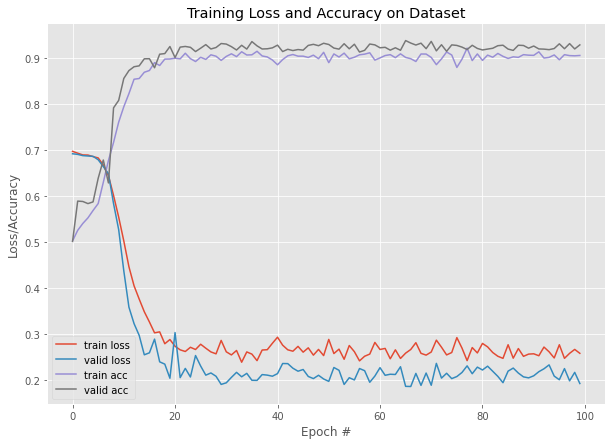

In [72]:
__trainer.load(last_checkpoint)
train_loss = __trainer.train_loss
valid_loss = __trainer.valid_loss
train_acc = __trainer.train_acc
valid_acc = __trainer.valid_acc


def save_plots(train_acc, valid_acc, train_loss, valid_loss):
    """
    Function to save the loss and accuracy plots to disk.
    """
    # accuracy plots
    # loss plots
    plt.figure(figsize=(10, 7))
    plt.plot(train_loss, label='train loss')
    plt.plot(valid_loss, label='valid loss')
    plt.plot(train_acc, label='train acc')
    plt.plot(valid_acc, label='valid acc')
    plt.title("Training Loss and Accuracy on Dataset")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend(loc="lower left")
save_plots(train_acc, valid_acc, train_loss, valid_loss)

folder 		: /home/igofed/LiU/AI4Climate_/src/outputs/images is available


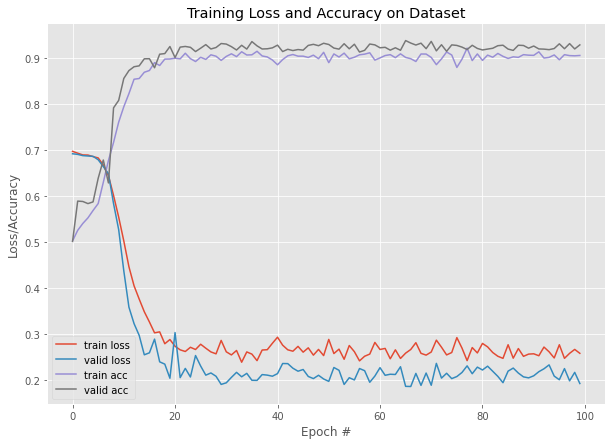

In [73]:
device = utils.select_device(gpu=False)
model_A = efficientnet.EfficientNet(
        version="efficientnet_b0",
        num_classes=2,
    ).to(device)


checkpoint = torch.load(last_checkpoint)
model_A.load_state_dict(checkpoint['model_state_dict'])
train_loss = checkpoint['train_loss']
train_acc = checkpoint['train_acc']
valid_loss = checkpoint['valid_loss']
valid_acc = checkpoint['valid_acc']
utils.save_plots(train_acc, valid_acc, train_loss, valid_loss, figure_name=last_checkpoint)
output_paths = os.path.join(os.getcwd(), 'outputs')
output_images = os.path.join(output_paths, 'images')
check_if_dir_existed(output_images, True)

In [80]:
import torch.nn.functional as F 



def get_predictions(model, iterator, device):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred = model(x)

            y_prob = F.softmax(y_pred, dim=-1)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim=0)
    labels = torch.cat(labels, dim=0)
    probs = torch.cat(probs, dim=0)

    return images, labels, probs



     
images, labels, probs = get_predictions(model_A, test_loader, device)
pred_labels = torch.argmax(probs, 1)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
def plot_confusion_matrix(labels, pred_labels, classes):

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1)
    cm = confusion_matrix(labels, pred_labels)
    cm = ConfusionMatrixDisplay(cm, display_labels=classes)
    cm.plot(values_format='d', cmap='Blues', ax=ax)
    plt.xticks(rotation=20)


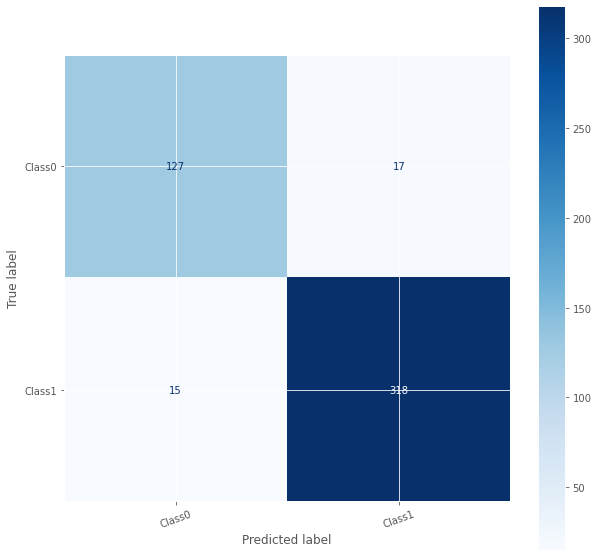

In [81]:
plot_confusion_matrix(labels, pred_labels, class_names)

/media/igofed/SSD_2T/DATASETS/weather_2/test
0 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_0401_1.png
1 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_1681_1.png
2 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_0121_1.png
3 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/mobile_0147_1.png
4 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0/mainz_0137_0.png
5 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0/desktop_1937_0.png
6 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0/munich_0196_0.png
7 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/mobile_0175_1.png
8 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0/munich_0143_0.png
9 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/mobile_0236_1.png


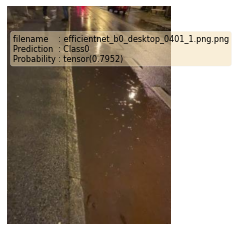

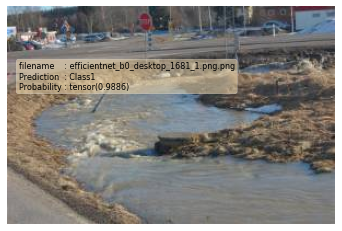

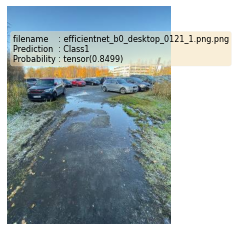

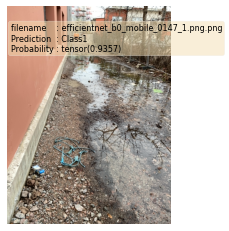

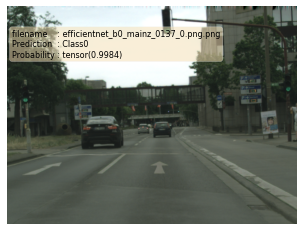

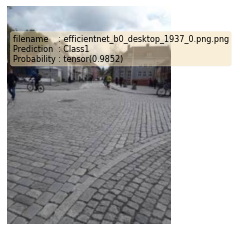

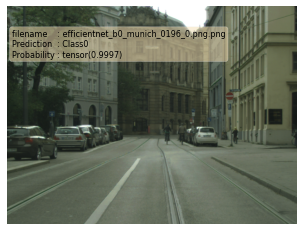

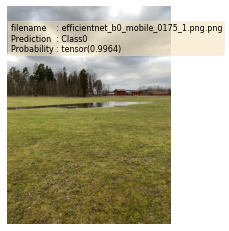

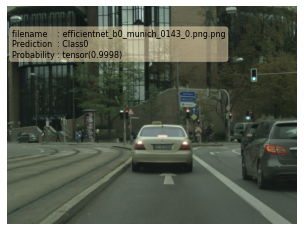

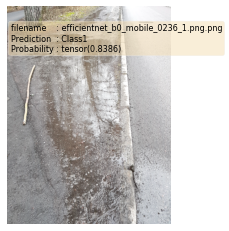

In [82]:
from pathlib import Path
import random
num_images_to_plot = 10
import torchvision
from torchvision import transforms
import cv2
from PIL import ImageFile, Image
print(test_path)
test_image_path_list = list(Path(test_path).glob("*/*.png")) # get list all image paths from test data 
test_image_path_sample = random.sample(population=test_image_path_list, # go through all of the test image paths
                                       k=num_images_to_plot) # randomly select 'k' image paths to pred and plot
i = 0

image_transform = transforms.Compose([
                    transforms.Resize((config.CFG.img_size, config.CFG.img_size)),
                    transforms.ToTensor(),
                    transforms.Normalize(
                        mean=config.CFG.mean, 
                        std=config.CFG.std)                
            ]
        )
model.to(device)
for image_path in test_image_path_sample:
    print(i, image_path)
        # Open image
    img = Image.open(image_path)
     # Turn on model evaluation mode and inference mode
    
    original_img = img.copy()
    model.eval()
    with torch.no_grad():
        # Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
        transformed_image = image_transform(img).unsqueeze(dim=0)
        target_image_pred = model(transformed_image.to(device))
      # Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)
    # Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)
    # Plot image with predicted label and probability
    #cv2.putText(
    #        img, f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}",
    #        (10, 25), cv2.FONT_HERSHEY_SIMPLEX,
    #        1.0, (0, 255, 0), 2, lineType=cv2.LINE_AA
    #    )
    #   
    image_path = f"{output_images}/{model_name}_{os.path.basename(image_path)}.png"
    #cv2.imwrite(image_path, img)
    #original_img.save("img1.png")
    plt.figure()
    plt.imshow(original_img)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    textstr = '\n'.join((
                    r'filename    : %s' % (os.path.basename(image_path),),        
                    r'Prediction  : %s' % (class_names[target_image_pred_label]),
                    r'Probability : %s' % (target_image_pred_probs.max()),

                    ))
    plt.text(10, 50, textstr, fontsize=8, verticalalignment='top', bbox=props)
    #plt.title(
    #    f"{os.path.basename(image_path)} Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    #)
    plt.axis(False)
    plt.savefig(image_path)
    i = i +1


from sklearn.metrics import accuracy_score

In [22]:
__trainer.save_plots()

TypeError: save_plots() missing 4 required positional arguments: 'train_loss', 'train_acc', 'valid_loss', and 'valid_acc'

In [68]:
test_set, test_loader = load_dataset(test_path, mode='test', balance_dataset=False)

 [INFO]: Custom Loader for :	 test data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: test Set:	477
	[INFO]: 144:	Class0 30.2%
	[INFO]: 333:	Class1 69.8%

[INFO] : Original test Set Size: 	477
	Num. of batches: 		15
	Num. of total examples: 	477
 ---------------------------------------


In [71]:
print(len(test_set))
print(device)

477
cpu


In [70]:
correct = 0
total = 0
import torch.nn.functional as F

def get_predictions(model, iterator, device):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred = model(x)

            y_prob = F.softmax(y_pred, dim=-1)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim=0)
    labels = torch.cat(labels, dim=0)
    probs = torch.cat(probs, dim=0)

    return images, labels, probs


images, labels, probs = get_predictions(model, test_loader, device)
pred_labels = torch.argmax(probs, 1)



RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same

In [56]:
images, labels, probs = get_predictions(model, test_loader, device)
pred_labels = torch.argmax(probs, 1)
print(pred_labels, len(pred_labels), len(probs), len(images))

tensor([0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0,
        1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0,
        1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0,
        1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1,
        1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
        0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0,
        0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1,
        0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1,
        0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
        0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0,
        1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,

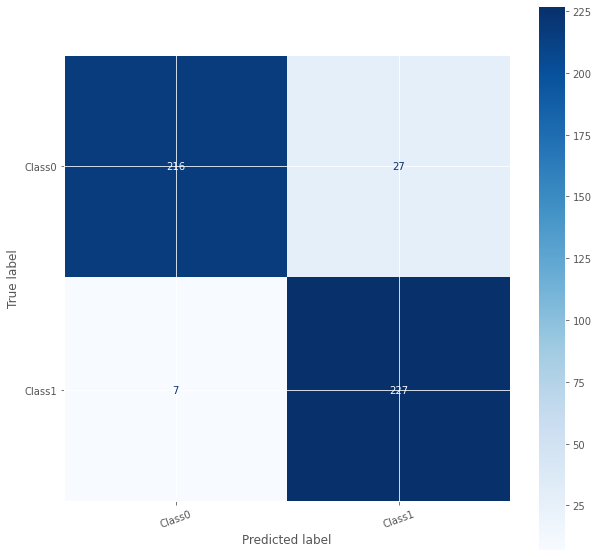

In [57]:
from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

def plot_confusion_matrix(labels, pred_labels, classes):

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1)
    cm = confusion_matrix(labels, pred_labels)
    cm = ConfusionMatrixDisplay(cm, display_labels=classes)
    cm.plot(values_format='d', cmap='Blues', ax=ax)
    plt.xticks(rotation=20)


plot_confusion_matrix(labels, pred_labels, class_names)

In [42]:
corrects = torch.eq(labels, pred_labels)
incorrect_examples = []

for image, label, prob, correct in zip(images, labels, probs, corrects):
    if not correct:
        incorrect_examples.append((image, label, prob))

incorrect_examples.sort(reverse=True,
                        key=lambda x: torch.max(x[2], dim=0).values)


In [43]:


def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min=image_min, max=image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_most_incorrect(incorrect, classes, n_images, normalize=True):

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(25, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)

        image, true_label, probs = incorrect[i]
        image = image.permute(1, 2, 0)
        true_prob = probs[true_label]
        incorrect_prob, incorrect_label = torch.max(probs, dim=0)
        true_class = classes[true_label]
        incorrect_class = classes[incorrect_label]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.cpu().numpy())
        ax.set_title(f'true label: {true_class} ({true_prob:.3f})\n'
                     f'pred label: {incorrect_class} ({incorrect_prob:.3f})')
        ax.axis('off')

    fig.subplots_adjust(hspace=0.4)


In [ ]:


y=[]
result = []
for images, labels in test_loader:
    images2=images.to(device)
    y_pred = model(images2).detach().cpu().numpy().argmax(axis=1).astype(int) 
    result.extend(y_pred)
    y.extend(labels)
    